[![Roboflow Notebooks](https://ik.imagekit.io/roboflow/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLOv8 Instance Segmentation on a Custom Dataset

---

[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/how-to-train-yolov8-on-a-custom-dataset)
[![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://youtu.be/wuZtUMEiKWY)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/ultralytics/ultralytics)

Ultralytics YOLOv8 is a popular version of the YOLO (You Only Look Once) object detection and image segmentation model developed by Ultralytics. The YOLOv8 model is designed to be fast, accurate, and easy to use, making it an excellent choice for a wide range of object detection and image segmentation tasks. It can be trained on large datasets and is capable of running on a variety of hardware platforms, from CPUs to GPUs.

## Accompanying Blog Post

We recommend that you follow along in this notebook while reading the accompanying [blog post](https://blog.roboflow.com/how-to-train-yolov8-instance-segmentation/).

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install YOLOv8
- CLI Basics
- Inference with Pre-trained COCO Model
- Roboflow Universe
- Preparing a custom dataset
- Custom Training
- Validate Custom Model
- Inference with Custom Model
- Deploy the Trained Model to Roboflow

**Let's begin!**

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Sat Oct 18 19:11:44 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install YOLOv8

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.2.103 -q

from IPython import display
display.clear_output()
# prevent ultralytics from tracking your activity
!yolo settings sync=False
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.8/235.7 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
!mkdir -p {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="________________")
project = rf.workspace("__________").project("________________")
version = project.version(___)
dataset = version.download(_________)



/content/{HOME}/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Segmentation_CoralQuadratMD-2 in yolov12:: 100%|██████████| 1342/1342 [00:00<00:00, 3460.93it/s]


## Custom Training

In [ ]:
%cd /content

!yolo task=segment mode=train model=yolov8s-seg.pt data={dataset.location}/data.yaml epochs=500 imgsz=640 patience = 30


/content
100% 22.8M/22.8M [00:00<00:00, 71.4MB/s]
New https://pypi.org/project/ultralytics/8.3.217 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/{HOME}/datasets/Segmentation_CoralQuadratMD-2/data.yaml, epochs=500, time=None, patience=30, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augme

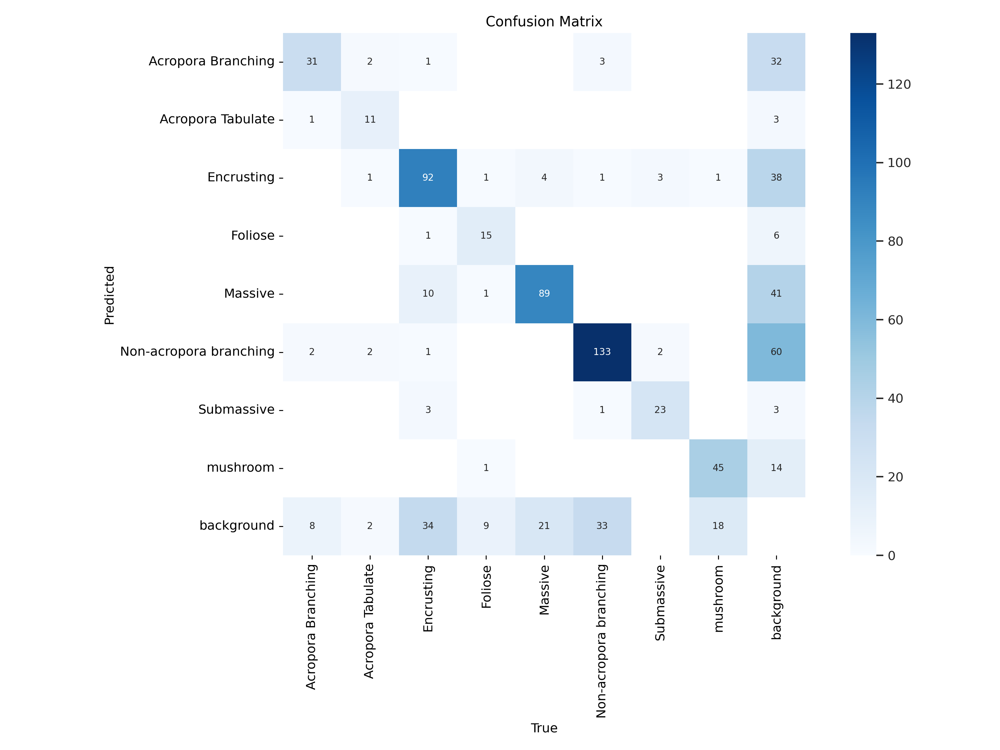

In [ ]:
import os
from IPython.display import Image

HOME = os.getcwd()  # or os.path.expanduser("~")

Image(filename=f'{HOME}/runs/segment/train/confusion_matrix.png', width=600)

/content


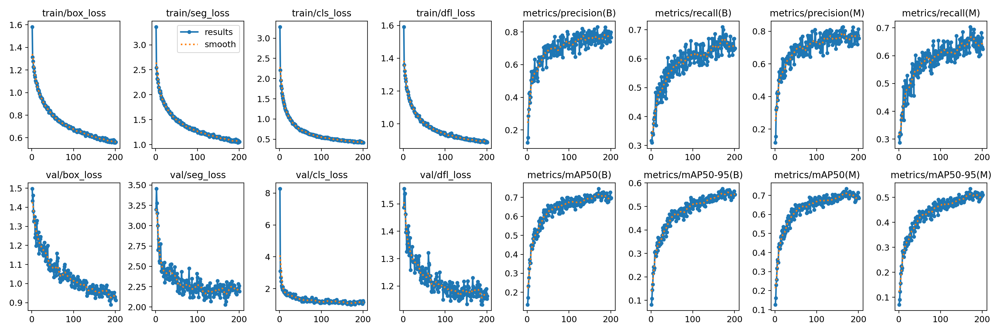

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/results.png', width=600)

/content


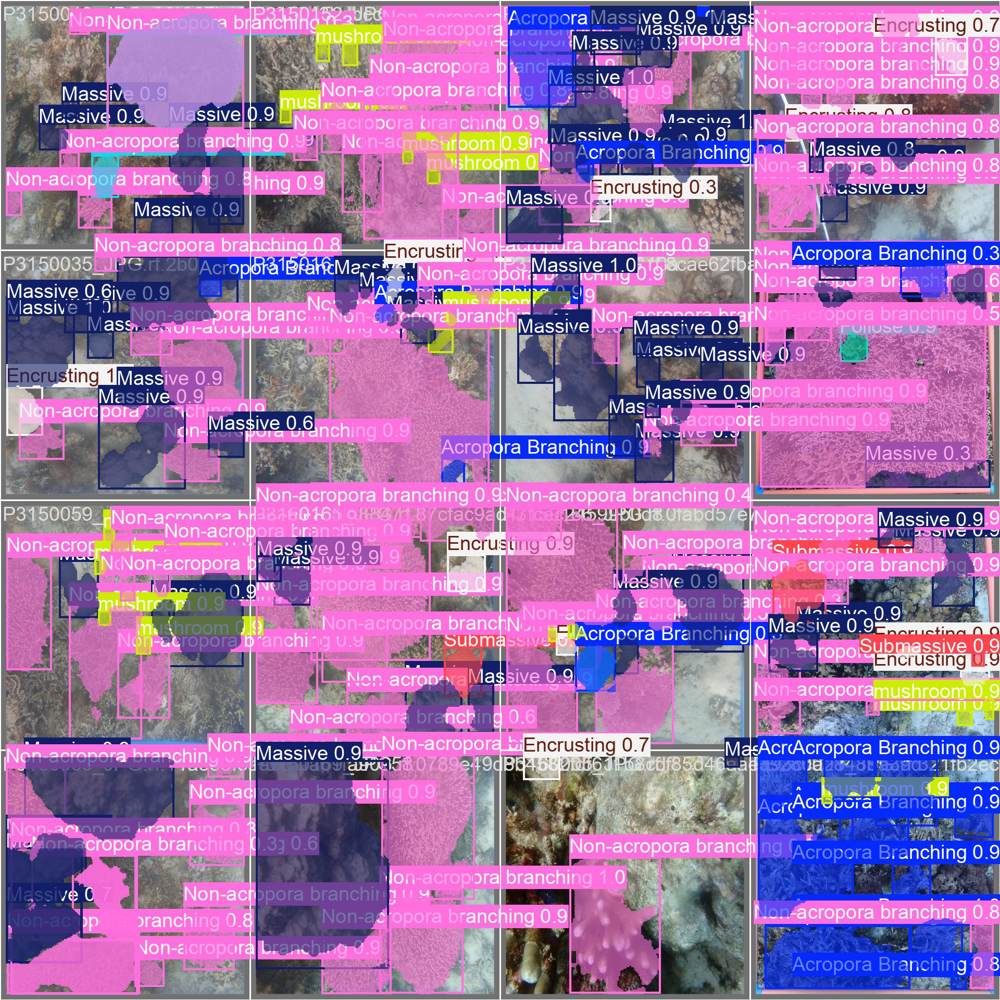

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/val_batch0_pred.jpg', width=600)

## Validate Custom Model

In [ ]:
%cd {HOME}

!yolo task=segment mode=val model={HOME}/runs/segment/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,782,696 parameters, 0 gradients, 39.9 GFLOPs
val: Scanning /content/{HOME}/datasets/Segmentation_CoralQuadratMD-2/valid/labels.cache... 40 images, 0 backgrounds, 0 corrupt: 100% 40/40 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 3/3 [00:03<00:00,  1.07s/it]
                   all         40        606      0.753      0.709      0.744      0.576      0.753      0.704      0.735      0.532
    Acropora Branching         18         42      0.496      0.667      0.567      0.374      0.516       0.69      0.591      0.385
     Acropora Tabulate          9         18       0.93      0.741      0.868      0.744       0.93      0.735      0.868      0.719
            Encrusting         28        142       0.72      0.648      0.698      0.523   

## Inference with Custom Model

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=true

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,782,696 parameters, 0 gradients, 39.9 GFLOPs

image 1/40 /content/{HOME}/datasets/Segmentation_CoralQuadratMD-2/test/images/P3150036_JPG.rf.2fd211e4965c647ed2e4d65bf77bbcbc.jpg: 640x640 9 Massives, 3 Non-acropora branchings, 20.9ms
image 2/40 /content/{HOME}/datasets/Segmentation_CoralQuadratMD-2/test/images/P3150038_JPG.rf.0a0832480d32f42fc463e74e25568956.jpg: 640x640 1 Non-acropora branching, 20.9ms
image 3/40 /content/{HOME}/datasets/Segmentation_CoralQuadratMD-2/test/images/P3150054_JPG.rf.b10cb6bc2388a8fc818251c70e2ebb35.jpg: 640x640 4 Massives, 13 Non-acropora branchings, 8 mushrooms, 20.9ms
image 4/40 /content/{HOME}/datasets/Segmentation_CoralQuadratMD-2/test/images/P3150055_JPG.rf.6521155c9dd742840bdc5070859c519d.jpg: 640x640 4 Encrustings, 12 Massives, 13 Non-acropora branchings, 3 mushrooms, 20.9ms
image 5/40 /content/{HOME}/datasets/Se

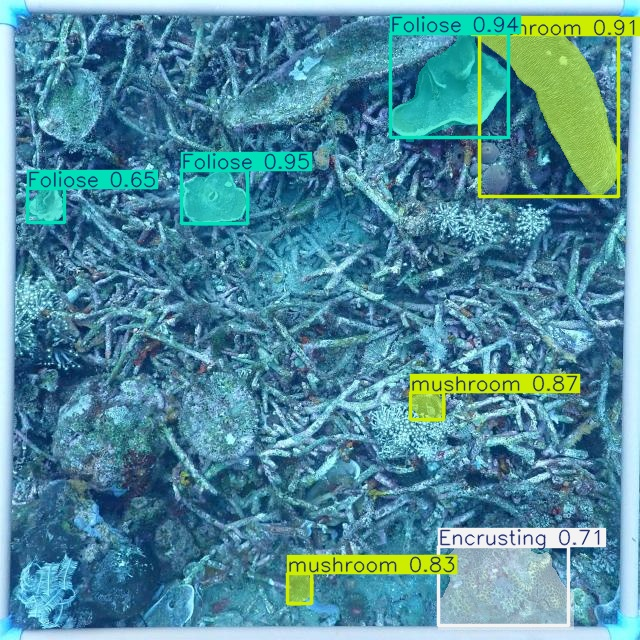

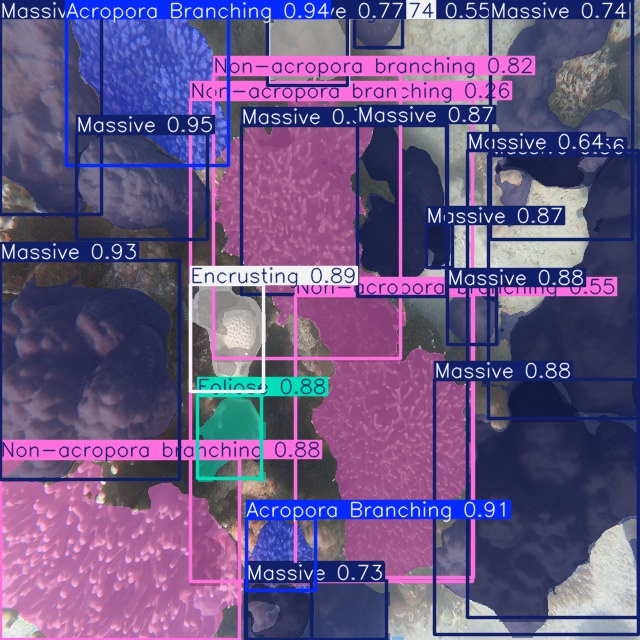

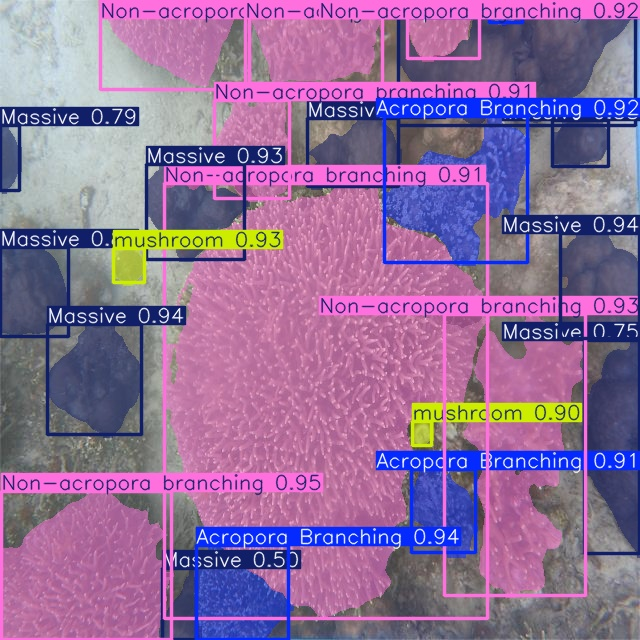

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/segment/predict/*.jpg')[:3]:
      display(Image(filename=image_path, height=600))
      print("\n")

In [ ]:
from google.colab import drive
import shutil
import os

# Step 1: Mount Google Drive
drive.mount('/content/drive')

# Step 2: Define source and destination paths
source_folder = os.path.expanduser("/content/runs")  # Expand HOME environment variable
destination_folder = "/content/drive/MyDrive/SEGMENT3/"  # Target folder in Google Drive

# Step 3: Create the destination folder if it doesn't exist
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

# Step 4: Copy the folder to Google Drive
shutil.copytree(source_folder, destination_folder, dirs_exist_ok=True)

print(f"Output successfully moved to {destination_folder}!")

Mounted at /content/drive
Output successfully moved to /content/drive/MyDrive/SEGMENT3/!


In [ ]:
!ls /content/drive/MyDrive/

 Classroom			 NewFireV8_V2
'Colab Notebooks'		 Quadrat
 COTS_TRAINING			 QuadratY12
 COTS_TRAINING_MD		 QuadratY12_MD
 COTS_TRAININGV2		 QuadratY12_Normal_150_75percent
'DETR Results'			 QuadratY12_Normal_200epochs_76percent
 DETRResultsV2			 QuadratY12_Optimized
 fire_classification_model2.h5	 QuadratY12_Optimized_50plusAcc
 fire_classification_model.h5	 QuadratY12_Optimized_MD_50plusAcc
 fire_training_results2.csv	 QuadratY12_Rev1
 fire_training_results.csv	 QuadratY12_Rev2_Aug
'Google Earth'			 QuadratY2
 GreenSeaweed			 SEGMENT
 JACKFRUIT_TRAINING		 SEGMENT2
 JACKFRUIT_TRAINING_V2		 SEGMENT3
 LUDIP				'Untitled document.gdoc'
 Magroves2			'Untitled drawing.gdraw'
 Mangroves2			 YOLOv8_QuadratY12_Normal_200epochs_75percent
 NewFireV8


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/SEGMENT3/segment/train/weights/best.pt")

results = model.predict(
    source="/content/drive/MyDrive/SEGMENT3/segment/test",
    conf=0.25,
    save=True,
    save_txt=True,      # this ensures YOLO saves polygon coordinates
    save_conf=True,     # optional: saves confidence values
    project="/content/drive/MyDrive/SEGMENT3/segment/results",
    name="coral_pred",
    task="segment"
)



image 1/6 /content/drive/MyDrive/SEGMENT3/segment/test/P3150053.JPG: 448x640 1 Acropora Branching, 1 Encrusting, 6 Massives, 11 Non-acropora branchings, 16.9ms
image 2/6 /content/drive/MyDrive/SEGMENT3/segment/test/PB280002 (1).JPG: 640x640 2 Acropora Branchings, 1 Acropora Tabulate, 2 Encrustings, 8 Folioses, 3 Massives, 21 Non-acropora branchings, 4 mushrooms, 16.7ms
image 3/6 /content/drive/MyDrive/SEGMENT3/segment/test/PB280003 (1).JPG: 640x640 2 Acropora Branchings, 4 Acropora Tabulates, 11 Encrustings, 5 Massives, 14 Non-acropora branchings, 2 Submassives, 7 mushrooms, 11.0ms
image 4/6 /content/drive/MyDrive/SEGMENT3/segment/test/PB280004.JPG: 640x640 3 Acropora Branchings, 1 Encrusting, 1 Foliose, 3 Massives, 8 Non-acropora branchings, 1 Submassive, 23 mushrooms, 9.8ms
image 5/6 /content/drive/MyDrive/SEGMENT3/segment/test/PB280013.JPG: 640x640 13 Acropora Branchings, 1 Acropora Tabulate, 1 Encrusting, 4 Submassives, 2 mushrooms, 9.6ms
image 6/6 /content/drive/MyDrive/SEGMENT3/

📷 P3150053.jpg


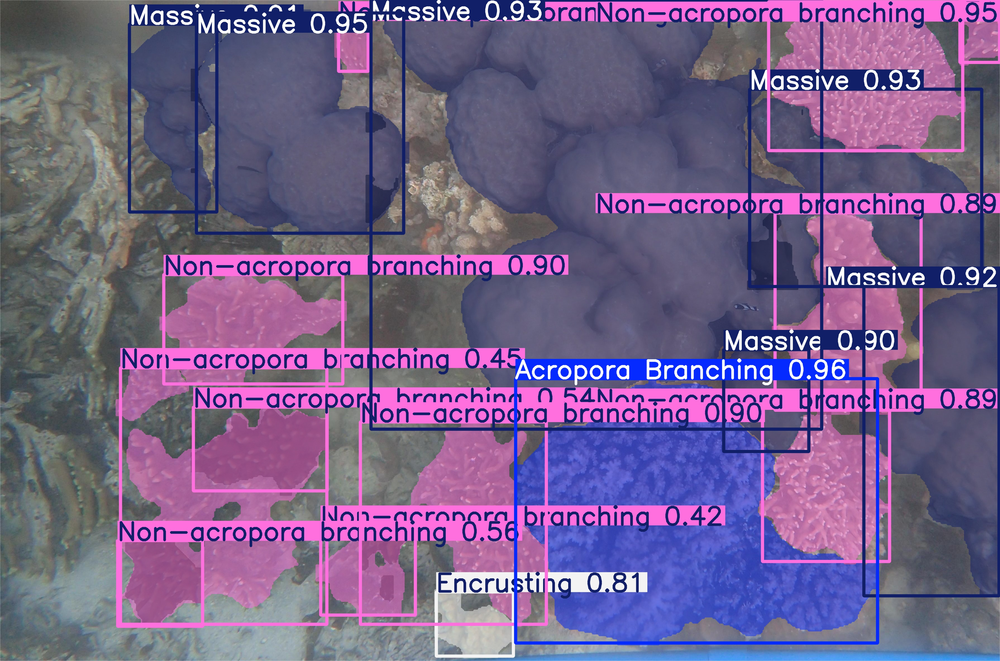



📷 PB280002 (1).jpg


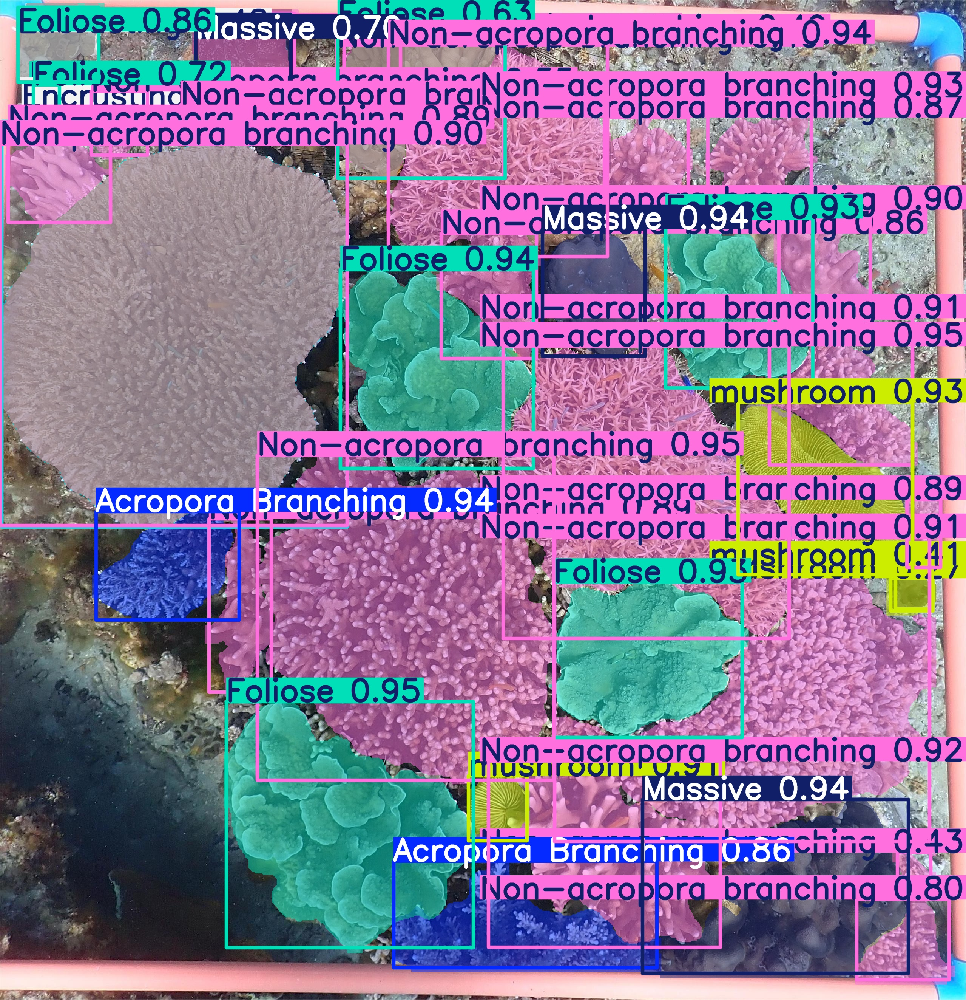



📷 PB280003 (1).jpg


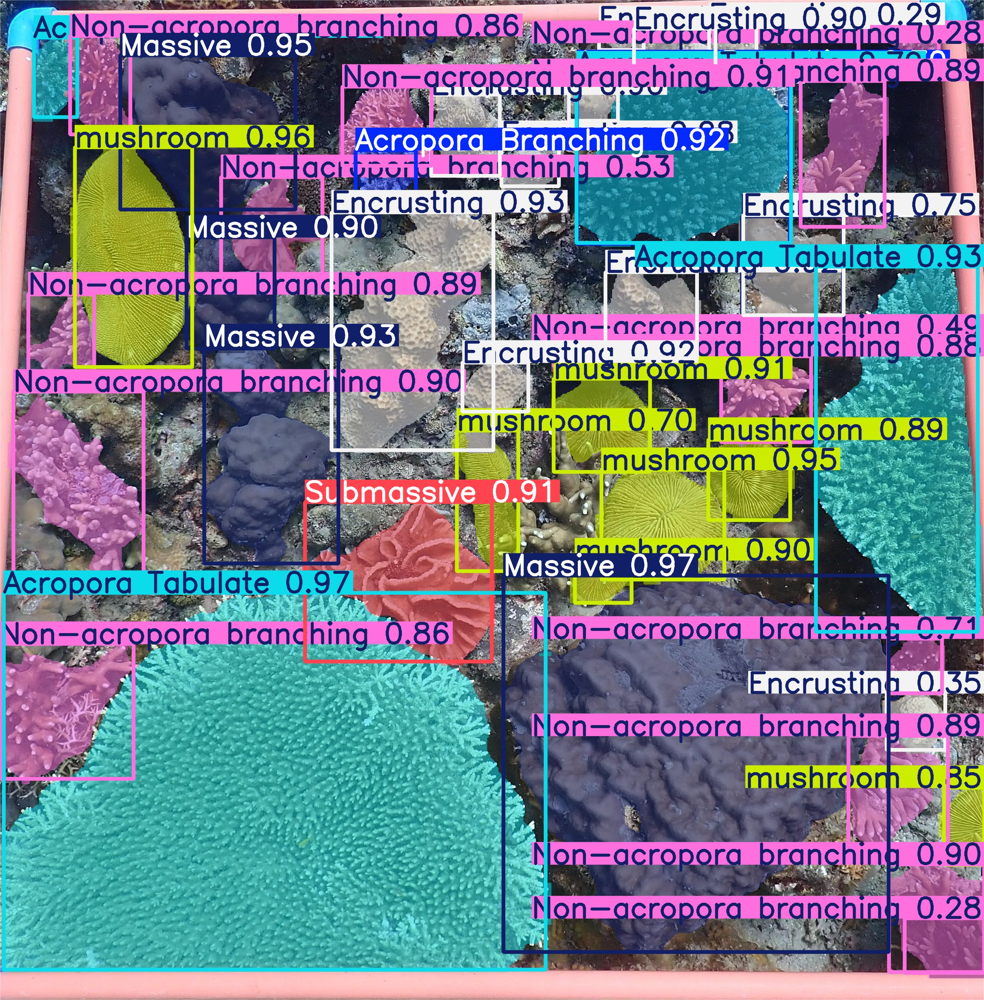



📷 PB280004.jpg


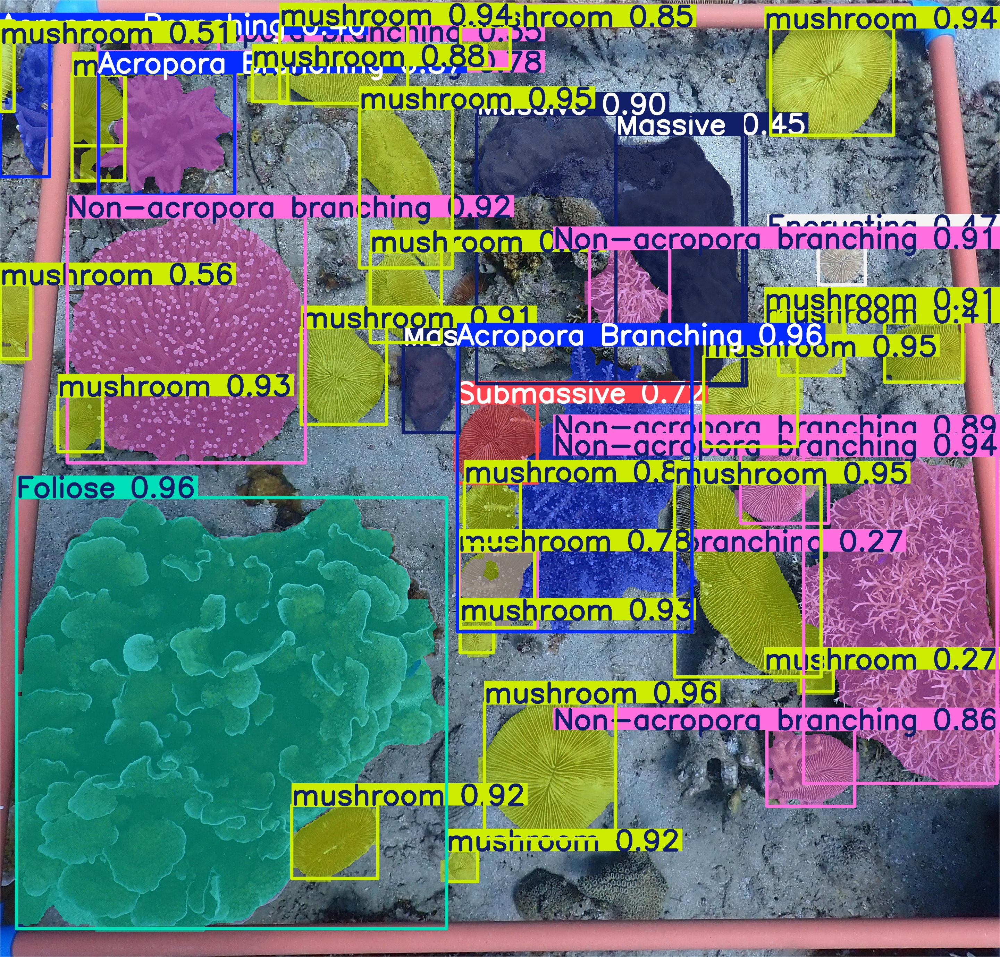



📷 PB280013.jpg


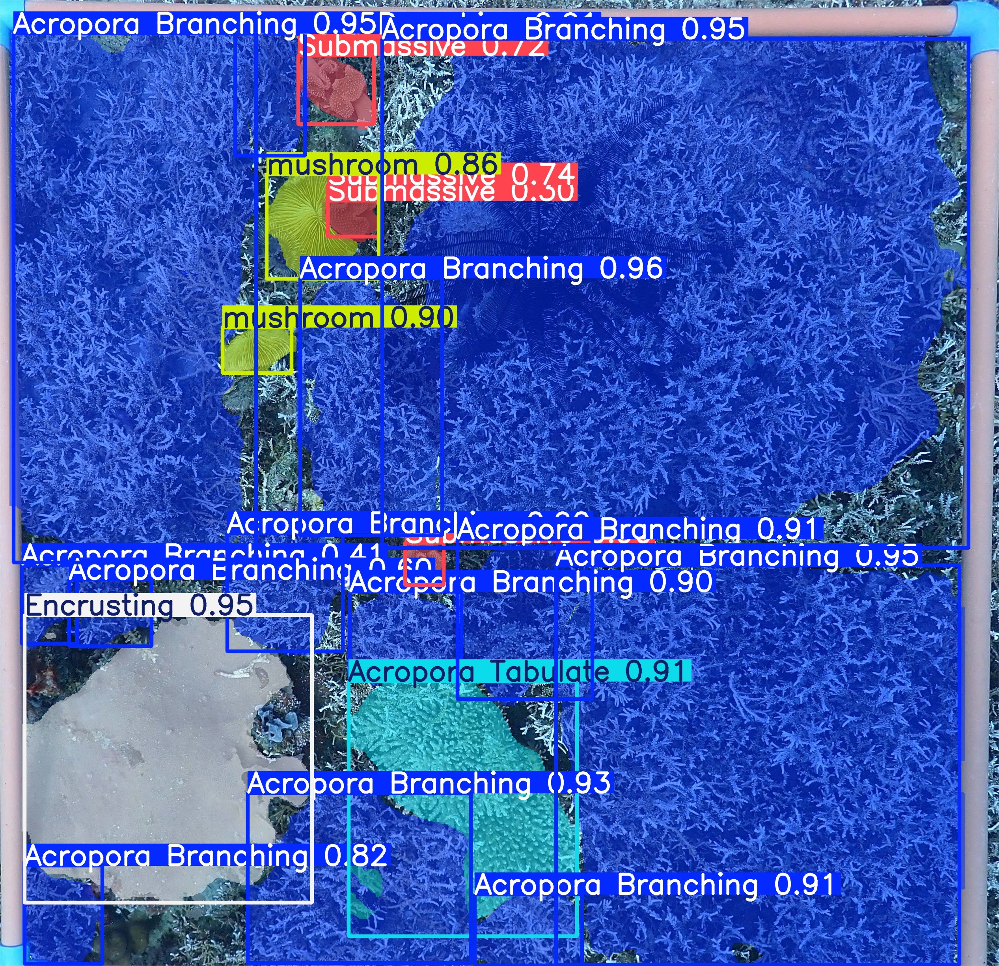

In [ ]:
import glob
from IPython.display import Image, display


PRED_PATH = "/content/drive/MyDrive/SEGMENT3/segment/results/coral_pred"  # adjust if needed

# Show up to 5 example outputs
for image_path in sorted(glob.glob(f"{PRED_PATH}/*.jpg"))[:5]:
    print(f" {image_path.split('/')[-1]}")
    display(Image(filename=image_path, width=600))
    print("\n")
